# Here I will use a scientific image of a solar scene to test the effect of distortion using the radial distortion model 

In [1]:
import numpy as np
import pyfits
import matplotlib.pyplot as plt
import skimage
from skimage.feature import blob_dog, blob_doh, blob_log, canny
from skimage.color import rgb2gray
from skimage.feature import corner_harris, corner_subpix, corner_peaks
from skimage.segmentation import slic
from skimage.filters import sobel
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from skimage import measure
from scipy.optimize import curve_fit
import matplotlib.ticker as mtick

/home/kahil/.local/lib/python2.7/site-packages/pyfits/__init__.py:22: PyFITSDeprecationWarning: PyFITS is deprecated, please use astropy.io.fits
  PyFITSDeprecationWarning)  # noqa


In [100]:
import sys
!{sys.executable} -m pip install seaborn --user

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support


In [99]:
!pip install pip --upgrade --user

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support
     |████████████████████████████████| 1.4MB 4.4MB/s eta 0:00:01


In [2]:
x_t = np.arange(20)
y_t = np.arange(20)

In [3]:
xy = np.meshgrid(x_t,y_t)


In [82]:
xy[0].shape

(20, 20)

In [83]:
i,j =np.indices([2048,2048])

In [84]:
i.shape

(2048, 2048)

In [85]:
center = np.array([(i.max()-i.min())/2.0,(j.max()-j.min())/2.0])

In [86]:
center

array([1023.5, 1023.5])

In [87]:
xc = center[1]
yc = center[0]

In [88]:
r = np.hypot(i-yc,j-xc)

In [92]:
s =500

In [93]:
Gaussian = (1/(s*np.sqrt(2*np.pi)))*np.exp(-r**2/(2*s**2))

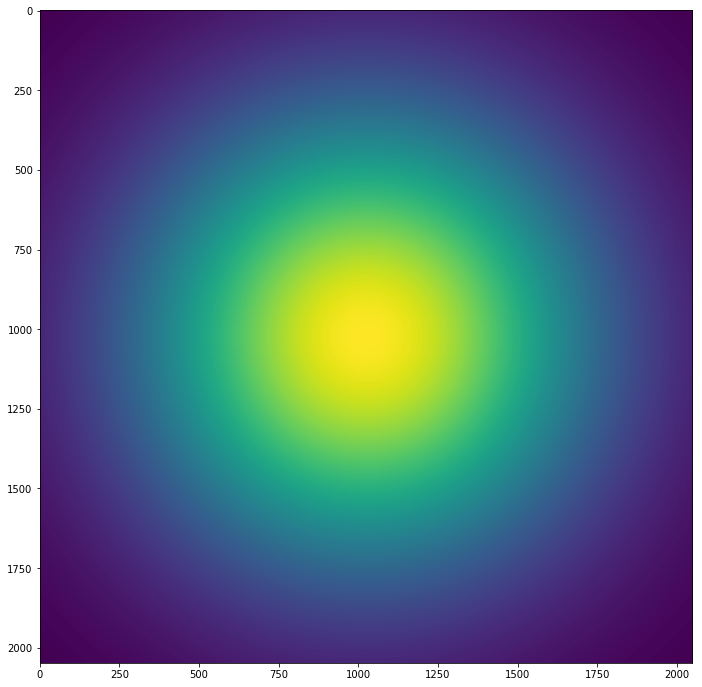

In [94]:
fig = plt.figure(figsize=(18,12))

plt.imshow(Gaussian)

In [93]:
np.exp(-r**2/(2*s**2))

array([[ 0.35079536,  0.35115441,  0.35151347, ...,  0.35151347,
         0.35115441,  0.35079536],
       [ 0.35115441,  0.35151382,  0.35187325, ...,  0.35187325,
         0.35151382,  0.35115441],
       [ 0.35151347,  0.35187325,  0.35223305, ...,  0.35223305,
         0.35187325,  0.35151347],
       ..., 
       [ 0.35151347,  0.35187325,  0.35223305, ...,  0.35223305,
         0.35187325,  0.35151347],
       [ 0.35115441,  0.35151382,  0.35187325, ...,  0.35187325,
         0.35151382,  0.35115441],
       [ 0.35079536,  0.35115441,  0.35151347, ...,  0.35151347,
         0.35115441,  0.35079536]])

In [96]:
hdu = pyfits.PrimaryHDU(Gaussian)
hdu.writeto('Gaussian.fits')

In [132]:
x_c =1009
y_c = 911
k=8e-09
output_distorted = np.zeros((2048,2048))


In [22]:
## invese model used for undistortion
def Inv(x_c,y_c,x_u,y_u,k):
  r_u = np.sqrt((x_u-x_c)**2+(y_u-y_c)**2) 
  x_d = x_c+(x_u-x_c)*(1-k*r_u**2)
  y_d = y_c+(y_u-y_c)*(1-k*r_u**2)
  return x_d,y_d
    

In [23]:
#Forward model used for distortion
def For(x_c,y_c,x_d,y_d,k):
  r_d = np.sqrt((x_d-x_c)**2+(y_d-y_c)**2) 
  x_u = x_d+(x_d-x_c)*(k*r_d**2)
  y_u = y_d+(y_d-y_c)*(k*r_d**2)
  return x_u,y_u
    

In [135]:
from scipy import interpolate
x = y = np.arange(2048)

F= interpolate.interp2d(x,y,Gaussian, kind='linear')


In [136]:
print F1(100.5,100.5)
print F2(100.5,100.5)

print Gaussian[100][100]

[2.64234093e-05]
[2.64234093e-05]
2.6325944250389016e-05


In [137]:
x[2047]

2047

In [138]:
for y_d in range(len(y)):
    for x_d in range(len(x)):
          x_u, y_u = For(x_c,y_c,x_d,y_d,k)
          output_distorted[y_d,x_d] = F(x_u, y_u)


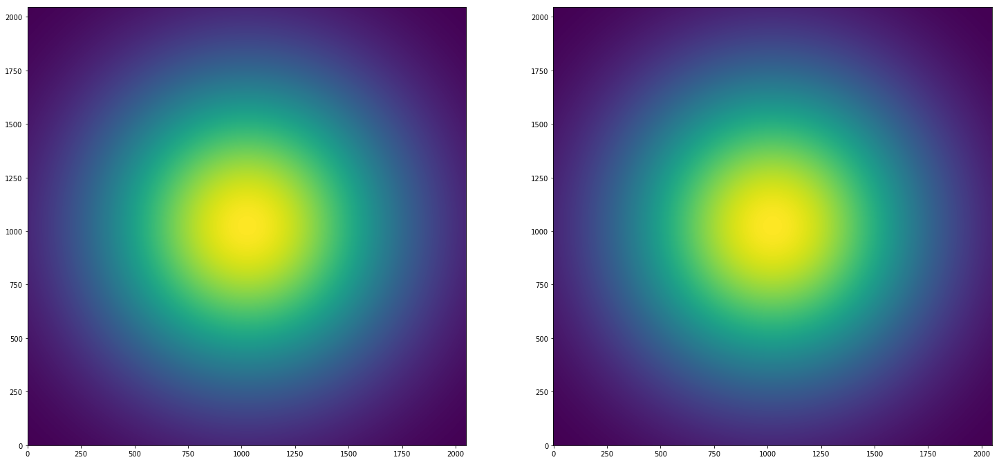

In [139]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(Gaussian,origin='lower')
ax2.imshow(output_distorted,origin='lower')

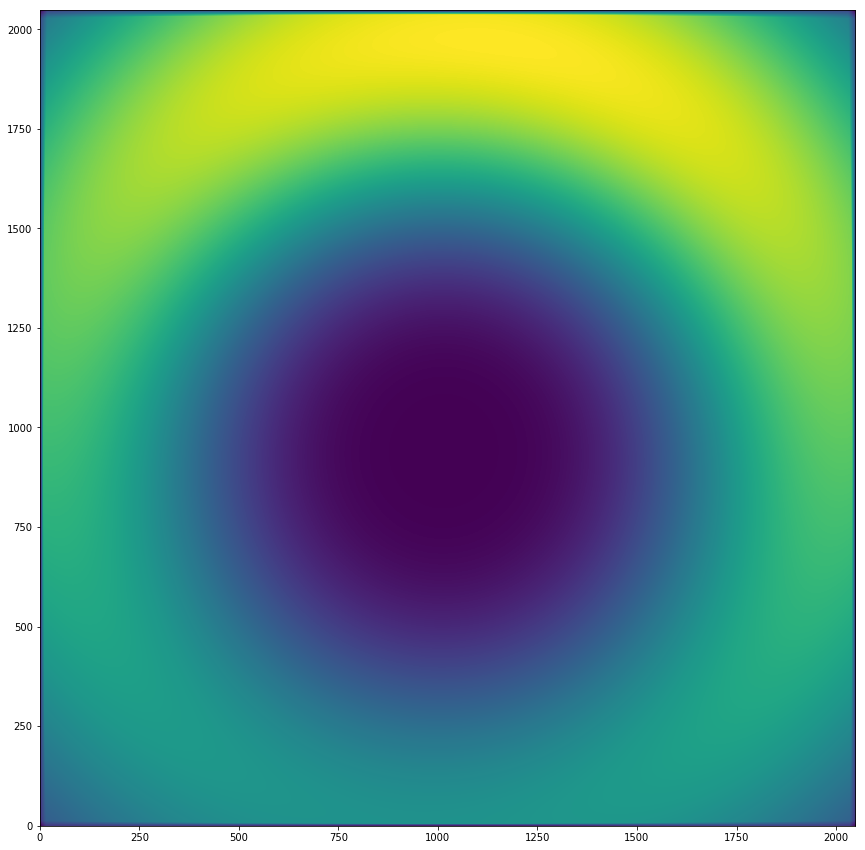

In [158]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(111)
ax1.imshow(Gaussian-output_distorted,origin='lower')


In [145]:
output_undistorted = np.zeros((2048,2048))


In [146]:
F= interpolate.interp2d(x,y,output_distorted, kind='linear')


In [147]:
for y_u in range(len(y)):
    for x_u in range(len(x)):
          x_d, y_d = Inv(x_c,y_c,x_u,y_u,k)
          output_undistorted[y_u,x_u] = F(x_d, y_d)


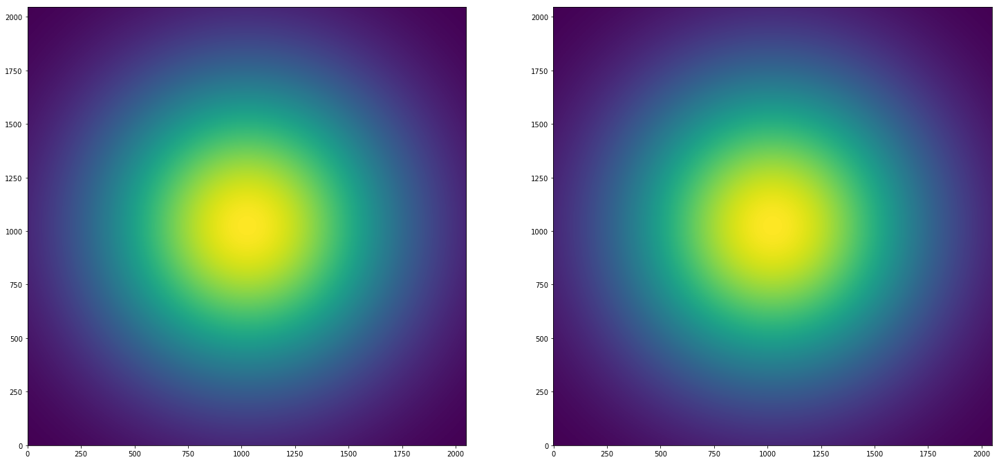

In [148]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(Gaussian,origin='lower')
ax2.imshow(output_undistorted,origin='lower')

In [151]:
Gaussian/output_undistorted



array([[0.99483349, 0.994948  , 0.99496399, ..., 0.99441718, 0.99440984,
        0.99430547],
       [0.99483622, 0.99496268, 0.99497867, ..., 0.99457469, 0.99455735,
        0.99444214],
       [0.99484059, 0.99497735, 0.99499332, ..., 0.99459019, 0.99457287,
        0.99446033],
       ...,
       [0.99126857, 0.99129146, 0.99131432, ..., 0.99074434, 0.99071969,
        0.99069502],
       [0.99124345, 0.99126635, 0.99128922, ..., 0.99071767, 0.99069301,
        0.99066832],
       [0.9912183 , 0.99124121, 0.9912641 , ..., 0.99069097, 0.9906663 ,
        0.9906416 ]])

In [128]:
x_d

2027.33662624

In [130]:
output_distorted ==  output_undistorted

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True, False, ...,  True,  True,  True],
       [ True, False,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True, False]])

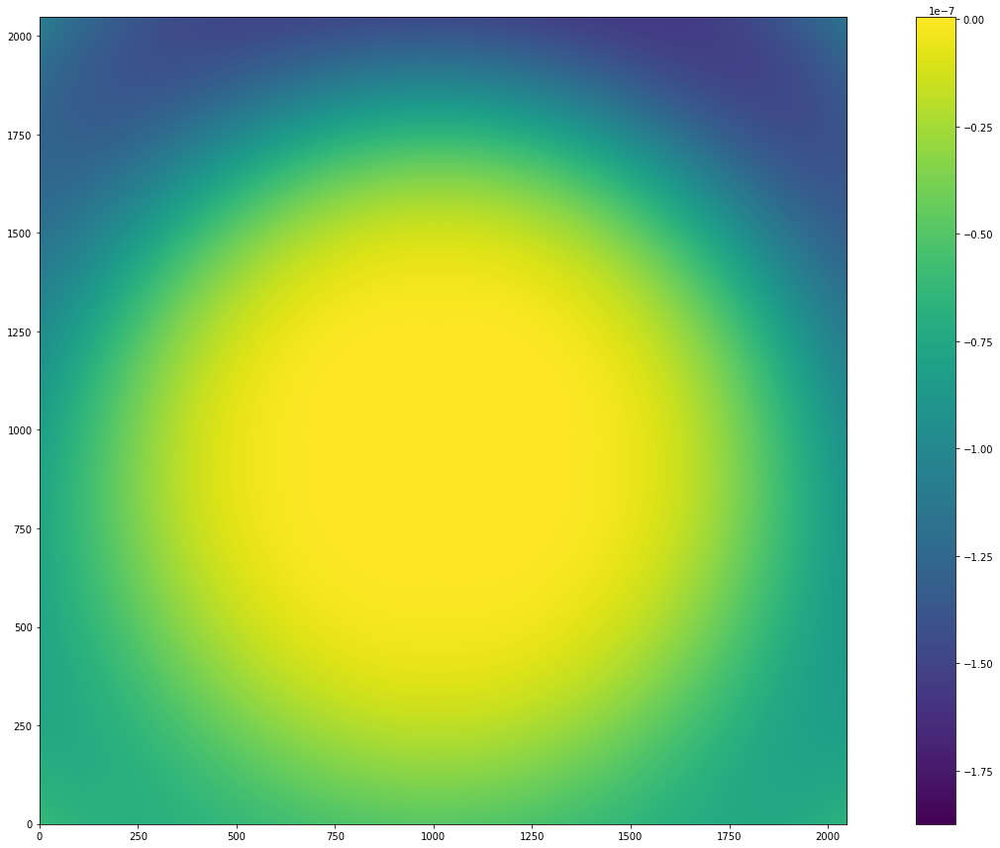

In [165]:
fig=plt.figure(figsize=(25,15))

plt.imshow(Gaussian-output_undistorted,origin='lower')
plt.colorbar()

In [173]:
RMS = np.sqrt((1./2048*np.sum(Gaussian-output_undistorted)**2))

In [174]:
RMS

0.004857875082055689

# using MURAM

# I want to have a simulation with a pixel size of 2048x2048 and pixel size of 0.5"/pixel. I have a MURAM simulation with a size of 600x600 and a resolution of 0.3"/pixel. I use Fourier transform to enlarge the simulation but the pixel resolution would be now 0.01"/pixel. But considering that the point here is to test my inverse model and not to compare with PHI data, this is fine.

In [38]:
from scipy import interpolate
def Resample(data1,pixel_size_1,pixel_size_2):

 len_X = len(data1[1,:])
 len_Y = len(data1[:,1])
 p = pixel_size_2/pixel_size_1
 xnew = np.arange(0, len_X, p)
 ynew = np.arange(0,len_Y,p)
 f= interpolate.interp2d(np.arange(len_X), np.arange(len_Y),data1, kind='linear')
 resamp_data1 = f(xnew,ynew)
 return resamp_data1, resamp_data1.shape

In [191]:
path = '/home/fatima/Desktop/solar_orbiter_project/codes/targets/distortion/'
mhd = pyfits.getdata(path+'synth_continuum_profile.fits')

In [192]:
mhd.shape

(600, 600)

In [195]:
mhd_r, shape = Resample(mhd,0.03,0.00879)

In [196]:
shape

(2048, 2048)

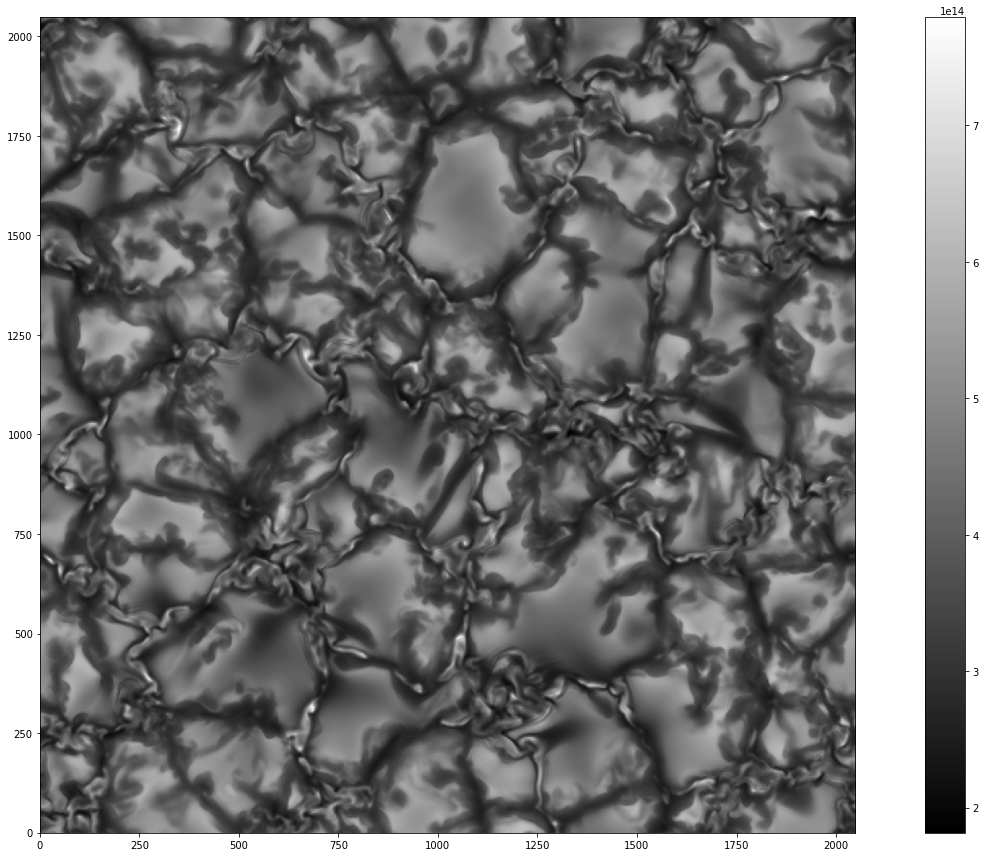

In [202]:
fig=plt.figure(figsize=(25,15))

plt.imshow(mhd_r,origin='lower')
plt.colorbar()

# Enlarging the simulation images

In [172]:
h_mhd = 600
w_mhd= 600
H = 2048
mhd_big = np.zeros((H,H))
a = np.fft.fft2(mhd)


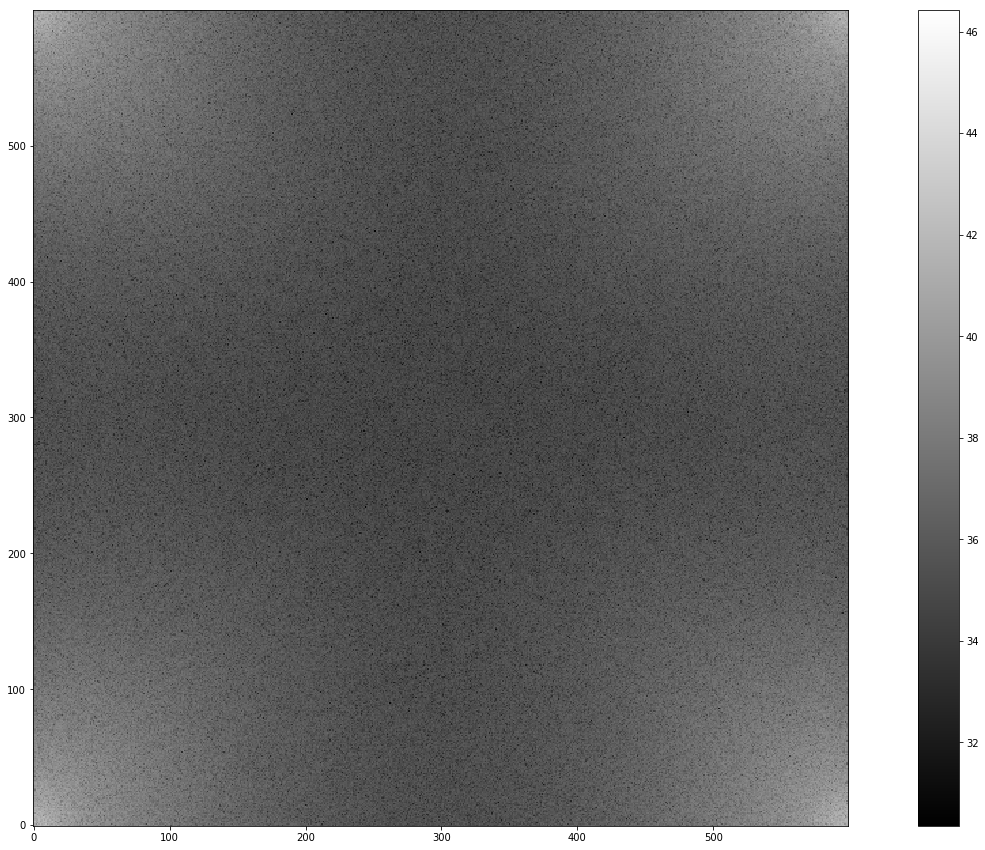

In [173]:
fig=plt.figure(figsize=(25,15))

plt.imshow(np.log(np.abs(a)),origin='lower')
plt.colorbar()

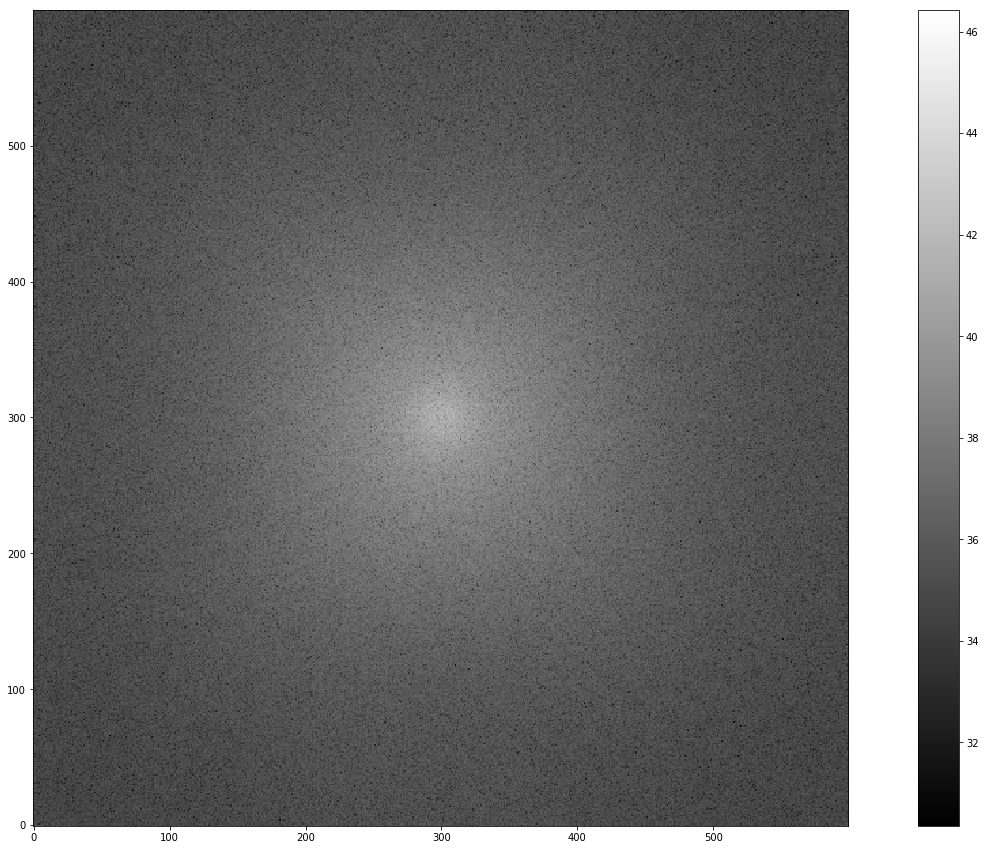

In [174]:
a = np.fft.fftshift(a)
fig=plt.figure(figsize=(25,15))

plt.imshow(np.log(np.abs(a)),origin='lower')
plt.colorbar()

In [175]:
b = np.zeros((H,H),dtype=complex)
b[(H-w_mhd)/2:(H+w_mhd)/2,(H-h_mhd)/2:(H+h_mhd)/2] = a 

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


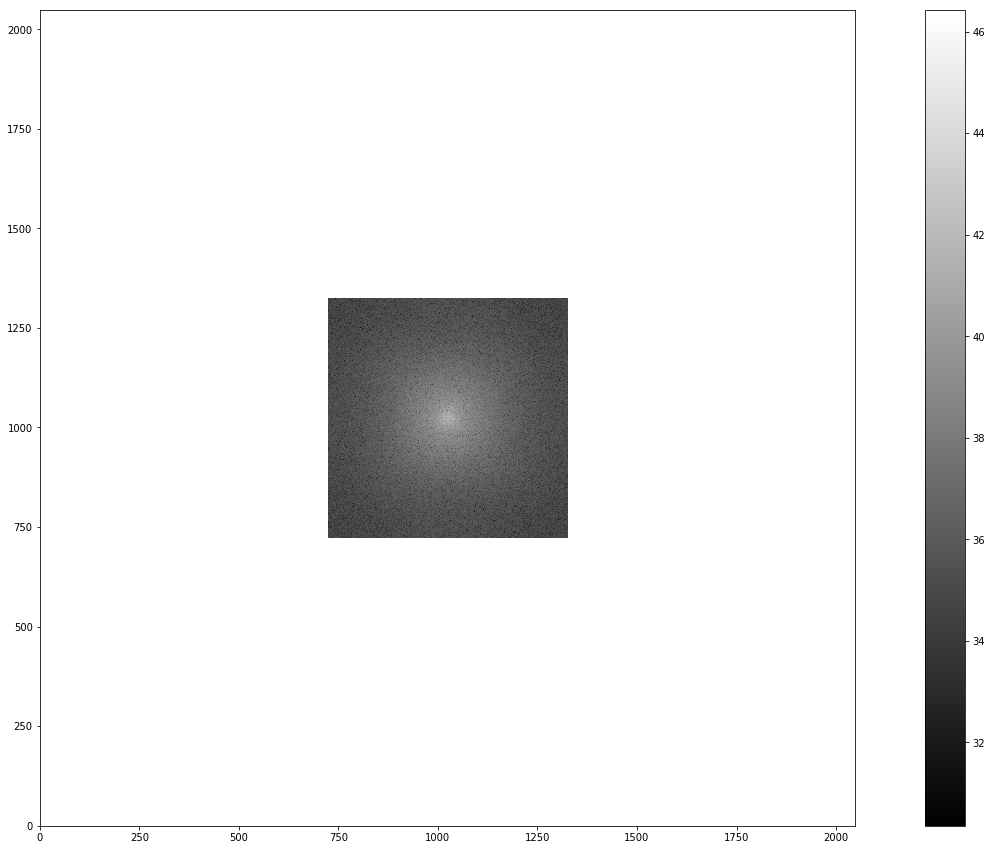

In [176]:

fig=plt.figure(figsize=(25,15))

plt.imshow(np.log(np.abs(b)),origin='lower')
plt.colorbar()

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


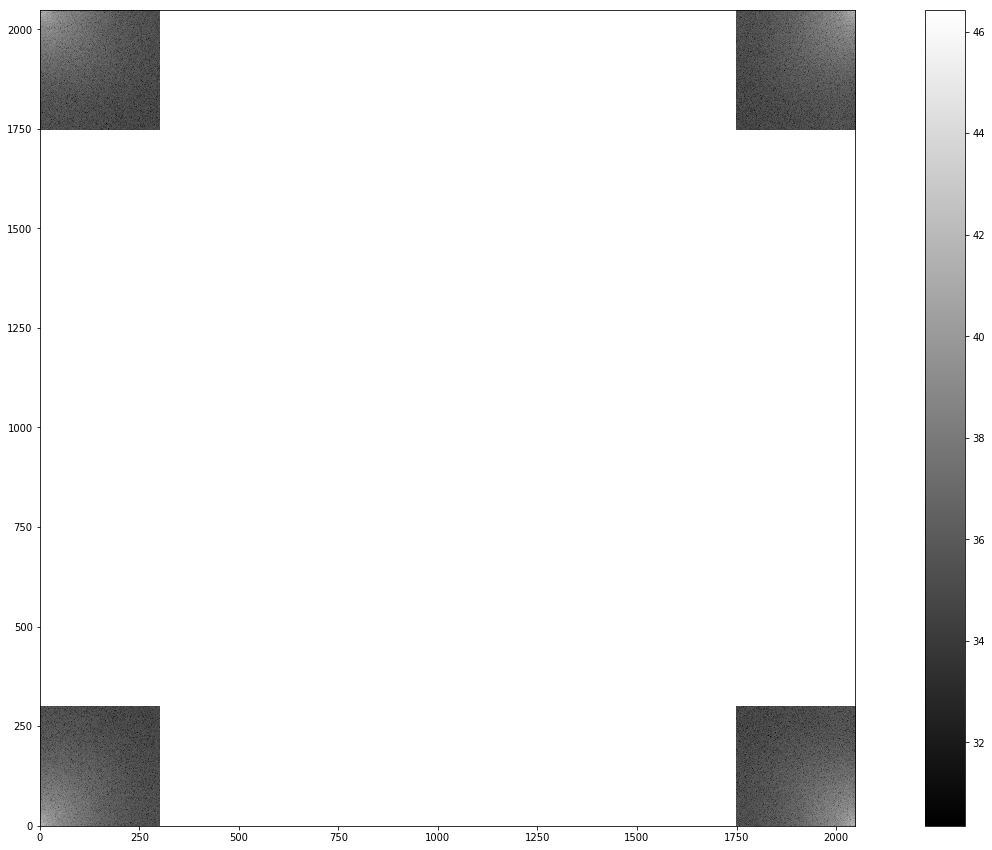

In [177]:
b = np.fft.ifftshift(b)

fig=plt.figure(figsize=(25,15))

plt.imshow(np.log(np.abs(b)),origin='lower')
plt.colorbar()

In [178]:
b = np.fft.ifft2(b)
mhd_big = np.abs(b)
#mtf_pd = mtf_pd/mtf_pd.max()

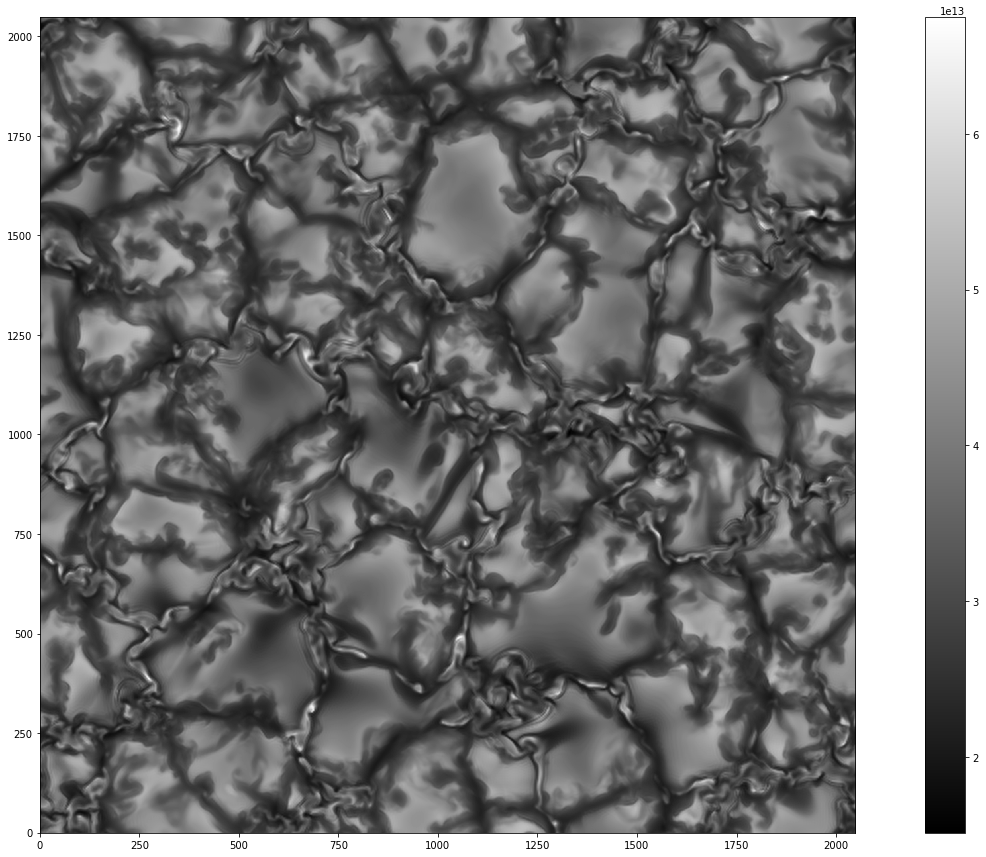

In [179]:
fig=plt.figure(figsize=(25,15))

plt.imshow(mhd_big,origin='lower')
plt.colorbar()

# Enlarging mhd using resize

In [200]:
C_test =  skimage.transform.resize(mhd,mode='edge',anti_aliasing=False,clip=False,output_shape=(2048,2048))

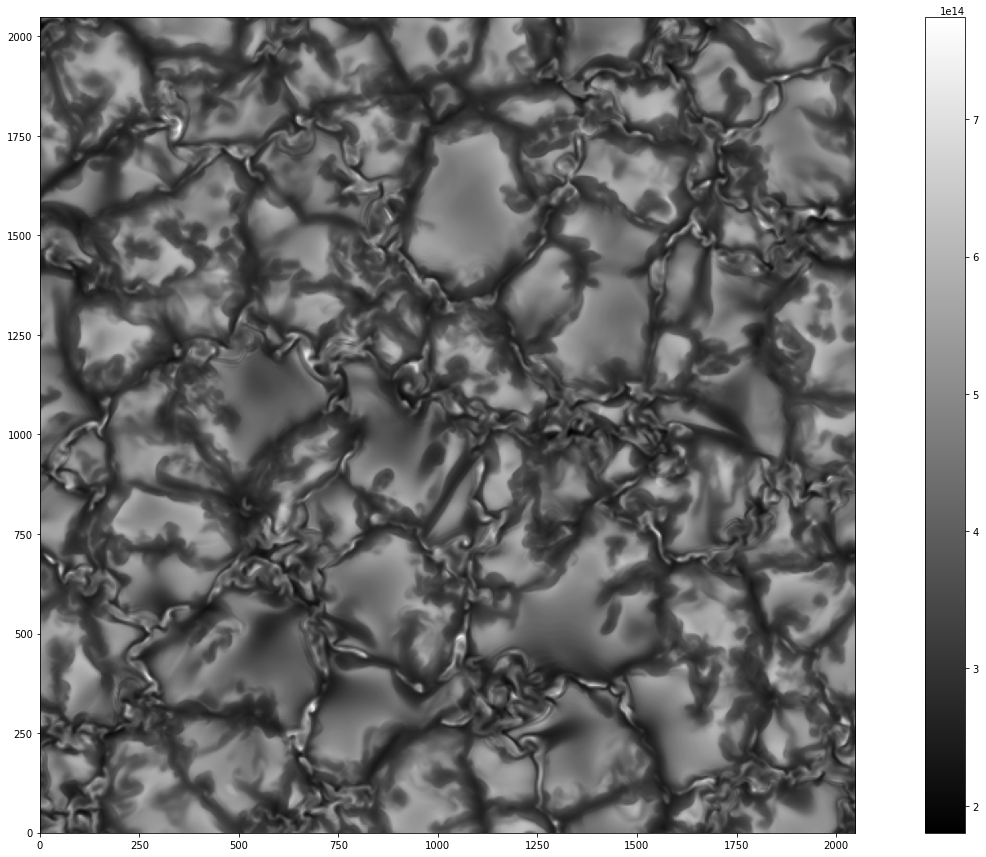

In [201]:
fig=plt.figure(figsize=(25,15))

plt.imshow(C_test,origin='lower')
plt.colorbar()

In [207]:
t = mhd_r/mhd_r.mean()
t1 = mhd_big/mhd_big.mean()
t2 = C_test/C_test.mean()

In [213]:
print mhd_r.mean()
print mhd_big.mean()
print C_test.mean()

400151619903675.44
34345554457787.55
400154767005883.25


# Distorting the 2048x2048 simulation with the coefficients derived from the distortion analysis


In [214]:
x_c = 1009
y_c = 911
k=8e-09
output_distorted = np.zeros((2048,2048))


In [215]:
from scipy import interpolate
x = y = np.arange(2048)

F= interpolate.interp2d(x,y,mhd_r, kind='linear')


In [216]:
for y_d in range(len(y)):
    for x_d in range(len(x)):
          x_u, y_u = For(x_c,y_c,x_d,y_d,k)
          output_distorted[y_d,x_d] = F(x_u, y_u)


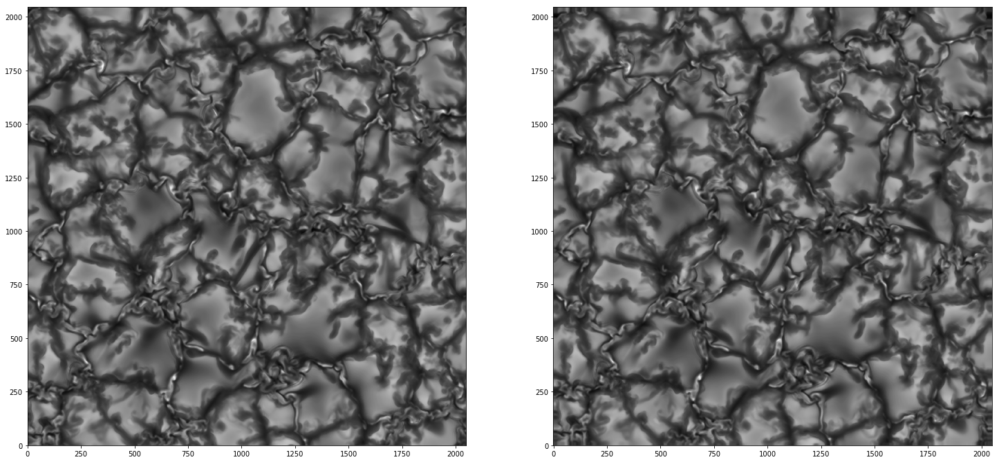

In [217]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(C_test,origin='lower')
ax2.imshow(output_distorted,origin='lower')

# Enlarging the magnetic field image

In [219]:
B = np.abs(pyfits.getdata(path+'B_los_p0.fits'))

In [220]:
B.mean()

236.90007

In [221]:
'''
h_mhd = 600
w_mhd= 600
H = 2048
B_big = np.zeros((2048,2048))
B_big = B_big+B.mean()
a = np.fft.fft2(B)
a = np.fft.fftshift(a)
b = np.zeros((2048,2048),dtype=complex)
b[(H-w_mhd)/2:(H+w_mhd)/2,(H-h_mhd)/2:(H+h_mhd)/2] = a 
b = np.fft.ifftshift(b)
b = np.fft.ifft2(b)
B_big = np.abs(b)
'''

B_r, shape = Resample(B,0.03,0.00879)


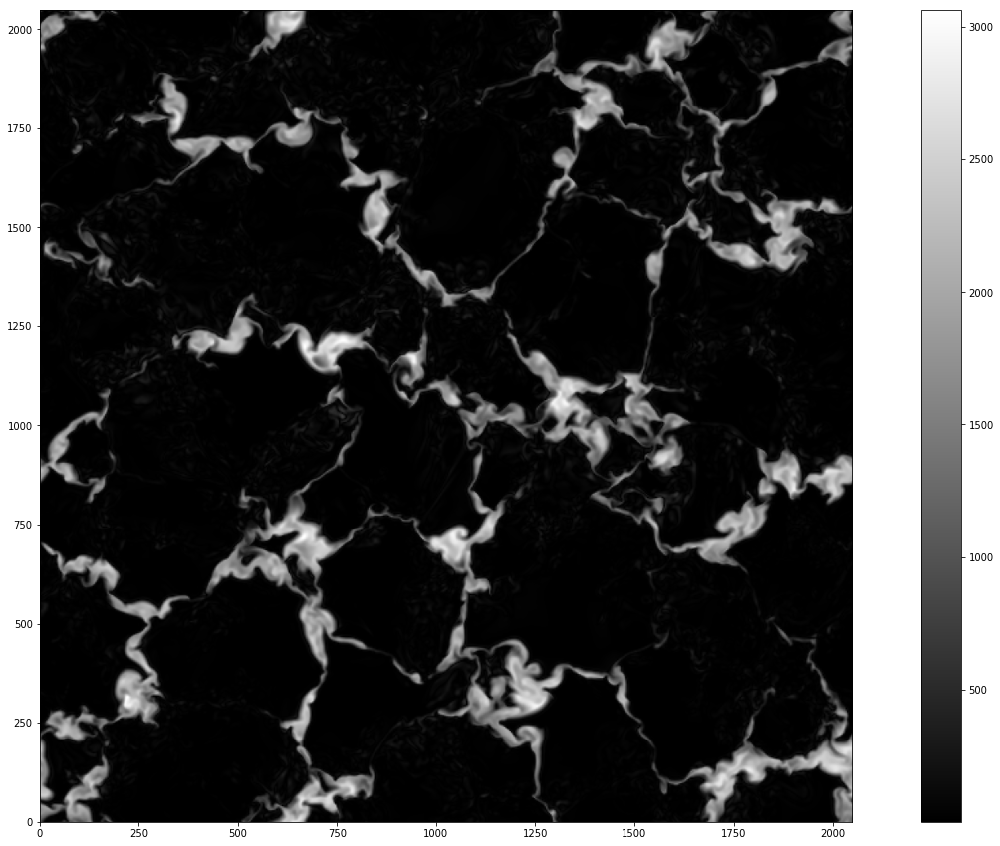

In [222]:
fig=plt.figure(figsize=(25,15))

plt.imshow(B_r,origin='lower')
plt.colorbar()

In [225]:
print B_r.mean()
print B_test.mean()

236.91931430437418
236.68208249832324


In [223]:
B_test = skimage.transform.resize(B,mode='constant',anti_aliasing=False,clip=False,output_shape=(2048,2048))

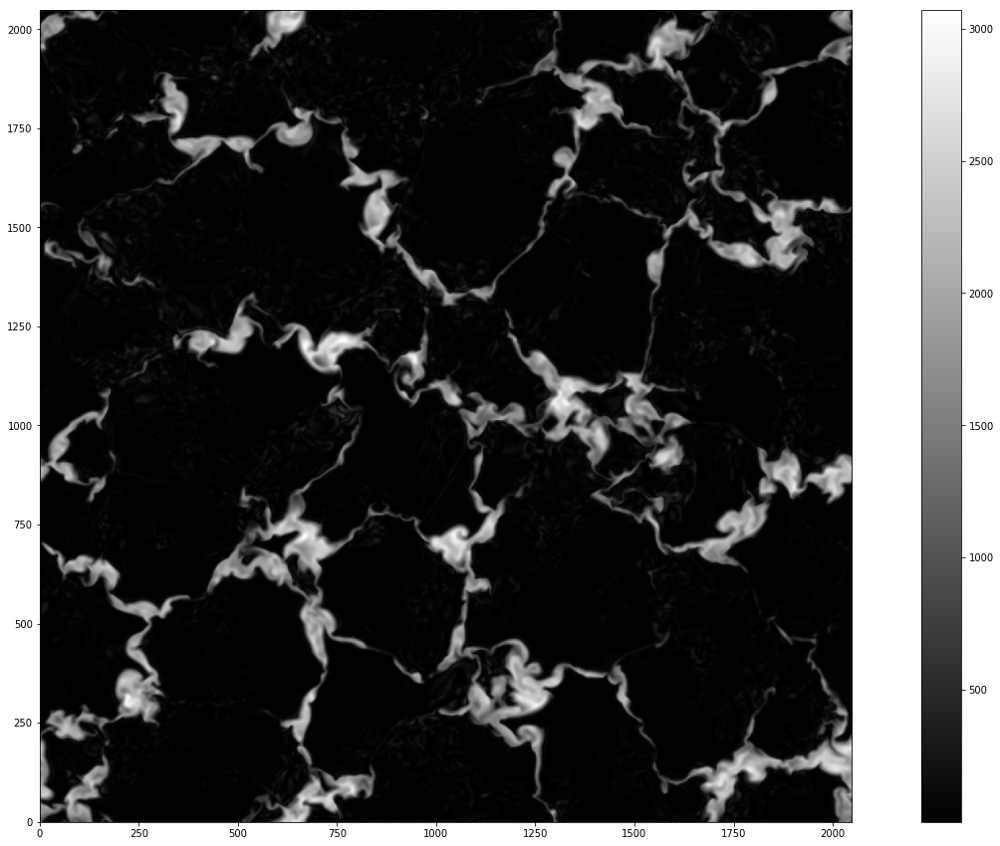

In [224]:
fig=plt.figure(figsize=(25,15))

plt.imshow(B_test,origin='lower')
plt.colorbar()

# distorting the magnetic field map


In [226]:
x_c = 1006
y_c = 913
k=8e-09
output_distorted_B = np.zeros((2048,2048))


In [227]:
from scipy import interpolate
x = y = np.arange(2048)

F_B= interpolate.interp2d(x,y,B_r, kind='linear')


In [228]:
for y_d in range(len(y)):
    for x_d in range(len(x)):
          x_u, y_u = For(x_c,y_c,x_d,y_d,k)
          output_distorted_B[y_d,x_d] = F_B(x_u, y_u)


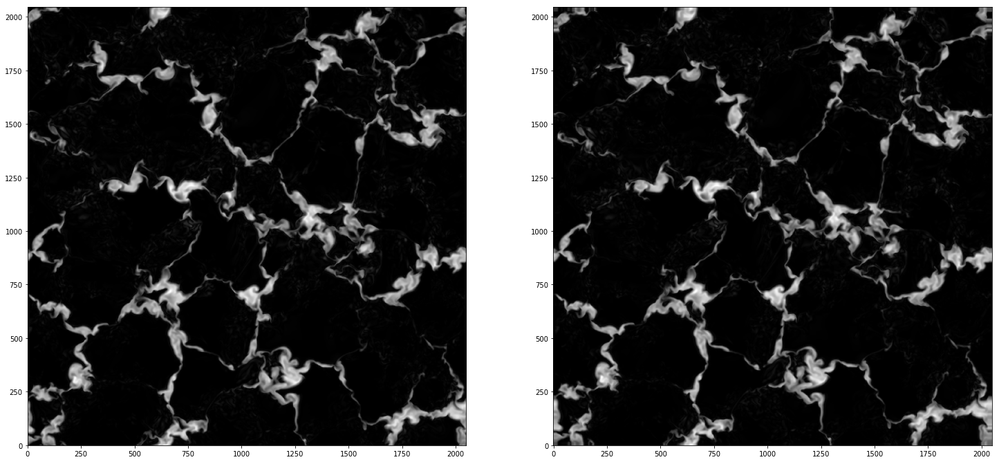

In [230]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(B_r,origin='lower')
ax2.imshow(output_distorted_B,origin='lower')

In [231]:
output_distorted_B.max()

3057.2100153915458

In [232]:
B.max()

3071.141

# Contours

In [233]:
Nx = Ny = 2048
new = np.zeros((Nx,Ny))
new2 = np.zeros((Nx,Ny))
new3 = np.zeros((Nx,Ny))
new4 = np.zeros((Nx,Ny))


In [234]:
for i in range(Nx):

 for j in range(Ny):
  if (B_r[i][j]>800) and (B_r[i][j]<3000):# and (C[i][j]>1):
    new[i][j] = 1
  else:
    new[i][j]=0


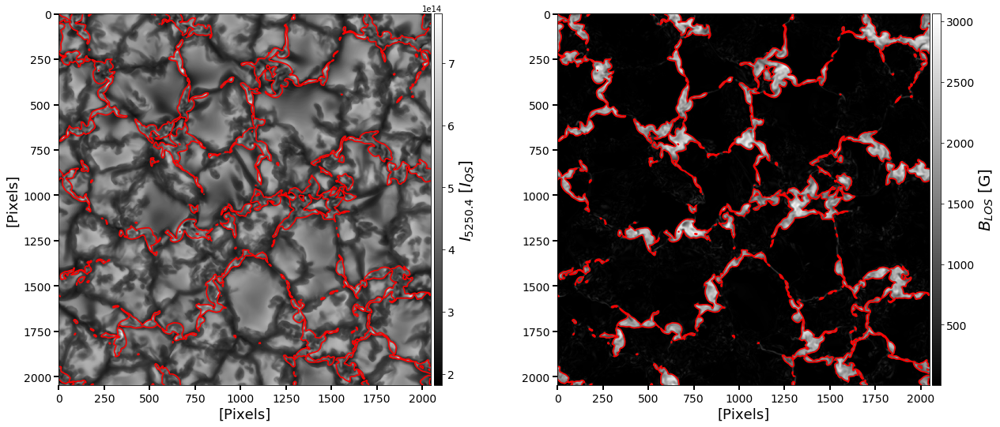

In [238]:
from mpl_toolkits.axes_grid1 import make_axes_locatable, axes_size
import pylab
fig=plt.figure(figsize=(20,10))
aspect = 5
pad_fraction = 0.5
ax = fig.add_subplot(1,2,1)
im=ax.imshow(mhd_r, cmap=pylab.gray())
#ax.set_xticks(np.arange(0,Nx,10))
#ax.set_yticks(np.arange(0,Ny,10))
#ax.set_xticks(np.arange(0,Nx,1),minor=True)
#ax.set_yticks(np.arange(0,Ny,1),minor=True)
ax.tick_params(axis = 'both', which = 'major',length=6, width=2,labelsize = 14)
ax.tick_params(axis = 'both', which = 'minor', length=4, width=2)
#ax.set_title('(c)',position=(.05, 1),fontsize=20)
ax.set_xlabel('[Pixels]',fontsize=18)
ax.set_ylabel('[Pixels]',fontsize=18)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size=0.15, pad=0.05)
cbar = plt.colorbar(im, cax=cax,orientation='vertical')#,ticks=np.arange(0.4,0.9,0.1))
cbar.set_label('$I_{5250.4}$ [$I_{QS}$]',fontsize=20)

cax.tick_params(labelsize=14)
ax.contour(x,y,new,[0],colors='red')
#ax.contour(x,y,new2,[0],colors='yellow')

cbar.set_label('$I_{5250.4}$ [$I_{QS}$]',fontsize=20)
#ax.contour(x,y,new3,[0],colors='green')
#ax.contour(x,y,new4,[0],colors='orange')


ax2 = fig.add_subplot(1,2,2)
im2=ax2.imshow(B_r)
#ax2.set_xticks(np.arange(0,Nx,10))
#ax2.set_yticks(np.arange(0,Ny,10))
#ax2.set_xticks(np.arange(0,Nx,1),minor=True)
#ax2.set_yticks(np.arange(0,Ny,1),minor=True)
ax2.tick_params(axis = 'both', which = 'major',length=6, width=2,labelsize = 14)
ax2.tick_params(axis = 'both', which = 'minor', length=4, width=2)
ax2.set_xlabel('[Pixels]',fontsize=18)
#ax2.set_ylabel('[Arcsec]',fontsize=18)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size=0.15, pad=0.05)
cbar2 = plt.colorbar(im2, cax=cax2,orientation='vertical')#,ticks=np.arange(0.4,0.9,0.1))
cax2.tick_params(labelsize=14)
ax2.contour(x,y,new,[0],colors='red')
#ax2.contour(x,y,new2,[0],colors='yellow')
cbar2.set_label('$B_{LOS}$ [G]',fontsize=20)
#ax2.contour(x,y,new3,[0],colors='green')
#ax2.contour(x,y,new4,[0],colors='orange')
plt.subplots_adjust(wspace=.3, hspace=None)
plt.savefig('B_sim_C_sim.png',dpi=300)

In [240]:
for i in range(Nx):

 for j in range(Ny):
  if (output_distorted_B[i][j]>800) and (output_distorted_B[i][j]<3000):# and (C[i][j]>1):
    new2[i][j] = 1
  else:
    new2[i][j]=0


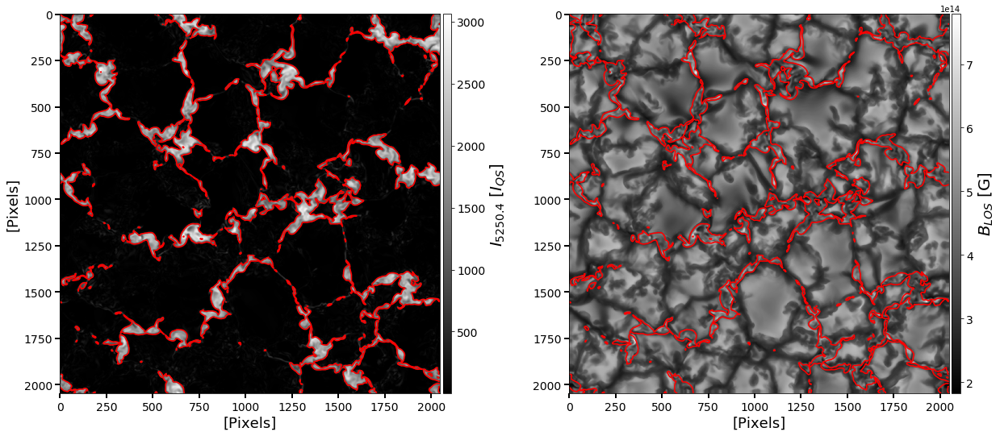

In [245]:
from mpl_toolkits.axes_grid1 import make_axes_locatable, axes_size
import pylab
fig=plt.figure(figsize=(20,10))
aspect = 5
pad_fraction = 0.5
ax = fig.add_subplot(1,2,1)
im=ax.imshow(B_r, cmap=pylab.gray())
#ax.set_xticks(np.arange(0,Nx,10))
#ax.set_yticks(np.arange(0,Ny,10))
#ax.set_xticks(np.arange(0,Nx,1),minor=True)
#ax.set_yticks(np.arange(0,Ny,1),minor=True)
ax.tick_params(axis = 'both', which = 'major',length=6, width=2,labelsize = 14)
ax.tick_params(axis = 'both', which = 'minor', length=4, width=2)
#ax.set_title('(c)',position=(.05, 1),fontsize=20)
ax.set_xlabel('[Pixels]',fontsize=18)
ax.set_ylabel('[Pixels]',fontsize=18)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size=0.15, pad=0.05)
cbar = plt.colorbar(im, cax=cax,orientation='vertical')#,ticks=np.arange(0.4,0.9,0.1))
cbar.set_label('$I_{5250.4}$ [$I_{QS}$]',fontsize=20)

cax.tick_params(labelsize=14)
ax.contour(x,y,new,[0],colors='red')
#ax.contour(x,y,new2,[0],colors='yellow')

cbar.set_label('$I_{5250.4}$ [$I_{QS}$]',fontsize=20)
#ax.contour(x,y,new3,[0],colors='green')
#ax.contour(x,y,new4,[0],colors='orange')


ax2 = fig.add_subplot(1,2,2)
im2=ax2.imshow(output_distorted)
#ax2.set_xticks(np.arange(0,Nx,10))
#ax2.set_yticks(np.arange(0,Ny,10))
#ax2.set_xticks(np.arange(0,Nx,1),minor=True)
#ax2.set_yticks(np.arange(0,Ny,1),minor=True)
ax2.tick_params(axis = 'both', which = 'major',length=6, width=2,labelsize = 14)
ax2.tick_params(axis = 'both', which = 'minor', length=4, width=2)
ax2.set_xlabel('[Pixels]',fontsize=18)
#ax2.set_ylabel('[Arcsec]',fontsize=18)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size=0.15, pad=0.05)
cbar2 = plt.colorbar(im2, cax=cax2,orientation='vertical')#,ticks=np.arange(0.4,0.9,0.1))
cax2.tick_params(labelsize=14)
ax2.contour(x,y,new,[0],colors='red')
#ax2.contour(x,y,new2,[0],colors='yellow')
cbar2.set_label('$B_{LOS}$ [G]',fontsize=20)
#ax2.contour(x,y,new3,[0],colors='green')
#ax2.contour(x,y,new4,[0],colors='orange')
plt.subplots_adjust(wspace=.3, hspace=None)
plt.savefig('B_sim_C_dist_contour_sim.png',dpi=300)

# Undistortion of the intensity image

In [246]:
output_undistorted = np.zeros((2048,2048))


In [247]:
F= interpolate.interp2d(x,y,output_distorted, kind='linear')


In [248]:
x_c = 1009
y_c = 911
k=8e-09
for y_u in range(len(y)):
    for x_u in range(len(x)):
          x_d, y_d = Inv(x_c,y_c,x_u,y_u,k)
          output_undistorted[y_u,x_u] = F(x_d, y_d)


In [249]:
print output_undistorted.mean()
print mhd_r.mean()

400155922806536.1
400151619903675.44


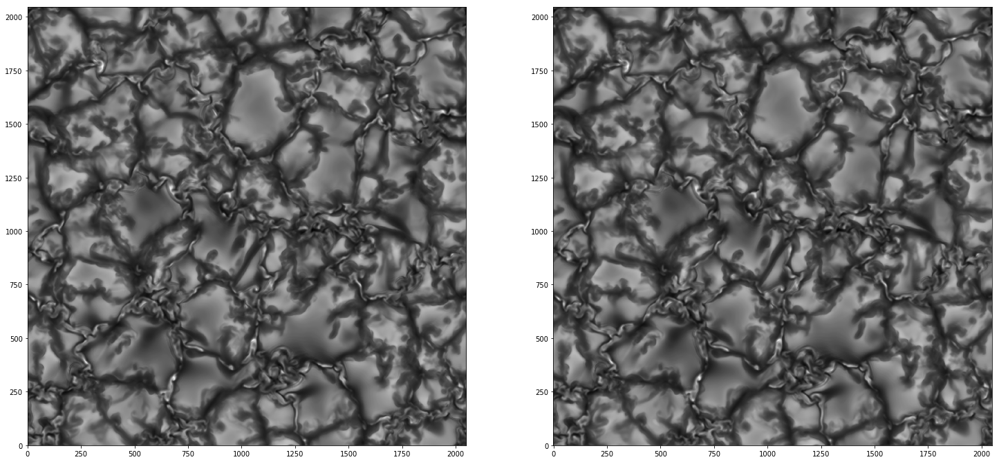

In [257]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(mhd_r,origin='lower')
ax2.imshow(output_undistorted,origin='lower')


In [260]:
(mhd_r/mhd_r.mean())[1000][1000] - (output_undistorted/output_undistorted.mean())[1000][1000]

-8.638369799118806e-05

In [261]:
t = mhd_r/mhd_r.mean()
t2 = output_undistorted/output_undistorted.mean()

In [264]:
RMS = 100*np.sqrt((1./2048**2)*np.sum((t-t2)**2))
print RMS


0.40177382066930123


In [266]:
print mhd_r.mean()
print output_undistorted.mean()

400151619903675.44
400155922806536.1


In [269]:
import pyqt_fit

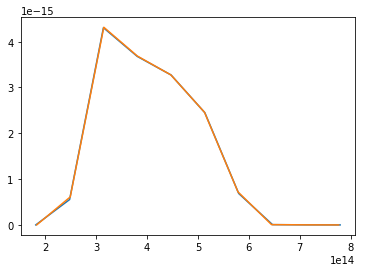

In [272]:
from pyqt_fit import kde
xnew_t = np.linspace(t.min(),t.max(),10)
est_t = kde.KDE1D(t)
ynew_t = est_t(xnew_t)
plt.plot(xnew_t,ynew_t)

xnew_t2 = np.linspace(t2.min(),t2.max(),10)
est_t2 = kde.KDE1D(t2)
ynew_t2 = est_t2(xnew_t2)
plt.plot(xnew_t2,ynew_t2)


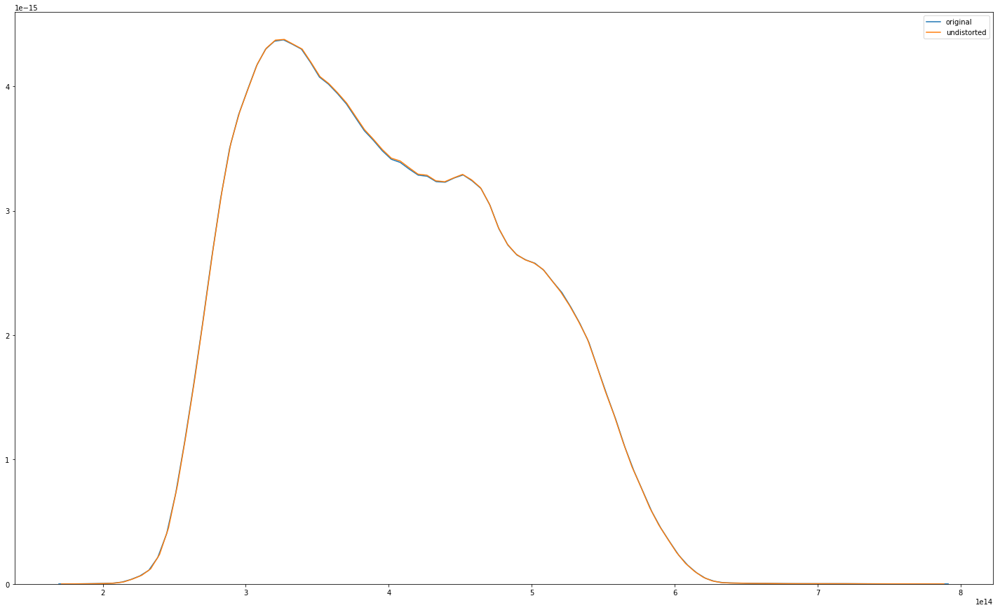

In [267]:
import seaborn as sns
t = np.ravel(mhd_r)
t2 = np.ravel(output_undistorted)
fig=plt.figure(figsize=(25,15))
sns.distplot(t,hist=False,kde=True,label='original')
sns.distplot(t2,hist=False,kde=True,label='undistorted')

# undistortion of the magnetic field map

In [273]:
x_c = 1006
y_c = 913
k=8e-09
output_undistorted_B = np.zeros((2048,2048))


In [274]:
F= interpolate.interp2d(x,y,output_distorted_B, kind='linear')


In [275]:
for y_u in range(len(y)):
    for x_u in range(len(x)):
          x_d, y_d = Inv(x_c,y_c,x_u,y_u,k)
          output_undistorted_B[y_u,x_u] = F(x_d, y_d)


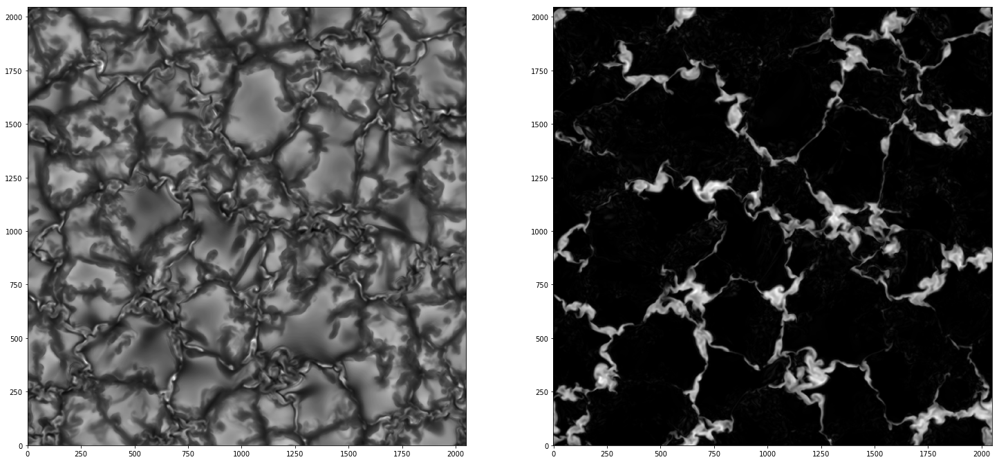

In [276]:
fig=plt.figure(figsize=(25,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(output_undistorted,origin='lower')
ax2.imshow(output_undistorted_B,origin='lower')

In [278]:
print B_r.mean()
print output_undistorted_B.mean()

236.91931430437418
236.8459273195616


In [285]:
RMS = 100*np.sqrt((1./2048**2)*np.sum((B_r-output_undistorted_B)**2))
print RMS
print B_r - output_undistorted_B


1065.6438793170134
[[ 11.59589154  10.37919424  11.47024919 ... -16.8267743   -7.33449332
   -7.2991187 ]
 [ 13.04138433  11.66918388  12.75265792 ... -15.53046905  -7.26166185
   -7.2773505 ]
 [ 15.52580184  13.44982428  13.88359927 ... -14.33161695  -7.23998245
   -7.25563902]
 ...
 [124.49538875 116.46801396 112.64644268 ...  42.10412373  99.20057806
  112.83528899]
 [ 58.8471322   57.693819    61.13764303 ... -38.0306764   11.0205819
   22.23001719]
 [ 46.0585437   45.93300267  50.64054655 ... -57.05754531 -10.22347649
    0.        ]]


In [286]:
for i in range(Nx):

 for j in range(Ny):
  if (output_undistorted_B[i][j]>800) and (output_undistorted_B[i][j]<3000):# and (C[i][j]>1):
    new3[i][j] = 1
  else:
    new3[i][j]=0


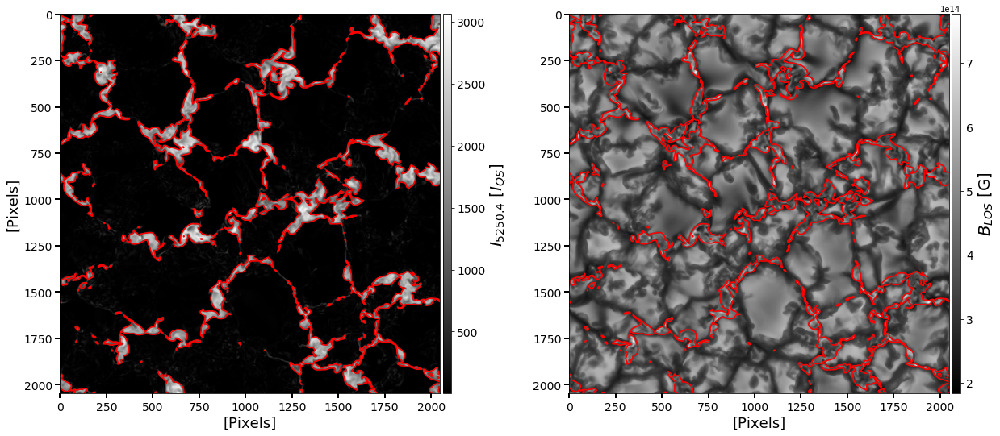

In [290]:
from mpl_toolkits.axes_grid1 import make_axes_locatable, axes_size
fig=plt.figure(figsize=(20,10))
aspect = 5
pad_fraction = 0.5
ax = fig.add_subplot(1,2,1)
im=ax.imshow(B_r, cmap=pylab.gray())
#ax.set_xticks(np.arange(0,Nx,10))
#ax.set_yticks(np.arange(0,Ny,10))
#ax.set_xticks(np.arange(0,Nx,1),minor=True)
#ax.set_yticks(np.arange(0,Ny,1),minor=True)
ax.tick_params(axis = 'both', which = 'major',length=6, width=2,labelsize = 14)
ax.tick_params(axis = 'both', which = 'minor', length=4, width=2)
#ax.set_title('(c)',position=(.05, 1),fontsize=20)
ax.set_xlabel('[Pixels]',fontsize=18)
ax.set_ylabel('[Pixels]',fontsize=18)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size=0.15, pad=0.05)
cbar = plt.colorbar(im, cax=cax,orientation='vertical')#,ticks=np.arange(0.4,0.9,0.1))
cbar.set_label('$I_{5250.4}$ [$I_{QS}$]',fontsize=20)

cax.tick_params(labelsize=14)
ax.contour(x,y,new3,[0],colors='red')
#ax.contour(x,y,new2,[0],colors='yellow')

cbar.set_label('$I_{5250.4}$ [$I_{QS}$]',fontsize=20)
#ax.contour(x,y,new3,[0],colors='green')
#ax.contour(x,y,new4,[0],colors='orange')


ax2 = fig.add_subplot(1,2,2)
im2=ax2.imshow(output_undistorted)
#ax2.set_xticks(np.arange(0,Nx,10))
#ax2.set_yticks(np.arange(0,Ny,10))
#ax2.set_xticks(np.arange(0,Nx,1),minor=True)
#ax2.set_yticks(np.arange(0,Ny,1),minor=True)
ax2.tick_params(axis = 'both', which = 'major',length=6, width=2,labelsize = 14)
ax2.tick_params(axis = 'both', which = 'minor', length=4, width=2)
ax2.set_xlabel('[Pixels]',fontsize=18)
#ax2.set_ylabel('[Arcsec]',fontsize=18)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size=0.15, pad=0.05)
cbar2 = plt.colorbar(im2, cax=cax2,orientation='vertical')#,ticks=np.arange(0.4,0.9,0.1))
cax2.tick_params(labelsize=14)
ax2.contour(x,y,new3,[0],colors='red')
#ax2.contour(x,y,new2,[0],colors='yellow')
cbar2.set_label('$B_{LOS}$ [G]',fontsize=20)
#ax2.contour(x,y,new3,[0],colors='green')
#ax2.contour(x,y,new4,[0],colors='orange')
plt.subplots_adjust(wspace=.3, hspace=None)
plt.savefig('B_und_C_undist_contour_und.png',dpi=300)

In [138]:
RMS = 100*np.sqrt((1./2048**2)*np.sum((B-B_und)**2))
print RMS

4.903715124561024


In [110]:
x_c_I =1010

y_c_I = 908
k_I=8.2e-09

In [112]:
x_c_V =1006
y_c_V = 913
k_V=8.185e-09

In [113]:
x_d, y_d = 2000, 2000

In [114]:
For(x_c_I,y_c_I,x_d,y_d,k_I)

(2017.636874552, 2019.4540070816)

In [115]:
For(x_c_V,y_c_V,x_d,y_d,k_V)

(2017.65166762345, 2019.303181797475)

In [117]:
np.sqrt((2017.636874552-2017.65166762345)**2+(2019.4540070816-2019.303181797475)**2)

0.15154900624647807

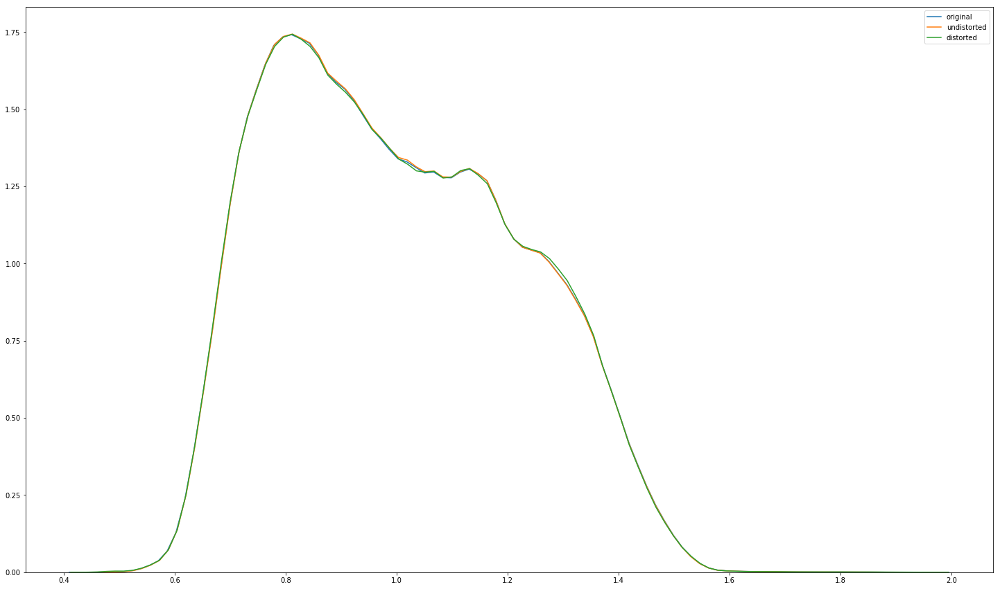

In [105]:
import seaborn as sns
mhd_big = np.ravel(mhd_big)
output_undistorted = np.ravel(output_undistorted)
output_distorted = np.ravel(output_distorted)
fig=plt.figure(figsize=(25,15))
sns.distplot(mhd_big,hist=False,kde=True,label='original')
sns.distplot(output_undistorted,hist=False,kde=True,label='undistorted')
sns.distplot(output_distorted,hist=False,kde=True,label='distorted')
